# PSEUDOLABELING PROCESS

Found 3 images in pseudo
Average image shape: 238, 0


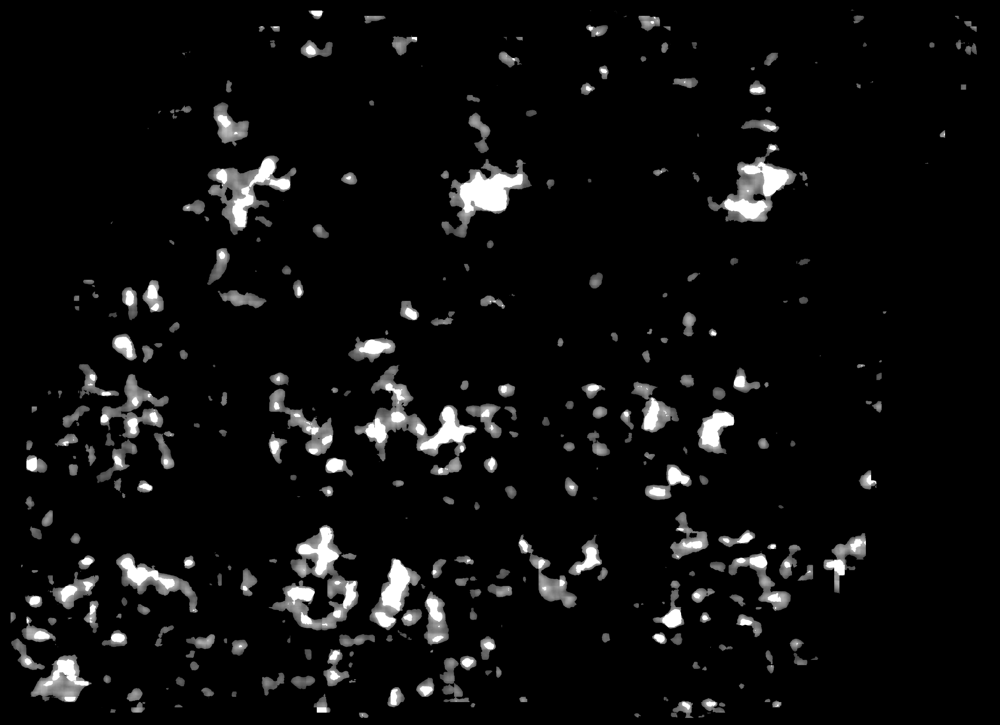

In [ ]:
import os
from PIL import Image
import numpy as np

def binary_consensus_with_average_fill(folder_path, threshold=128):
    # Get all valid image paths
    valid_extensions = ('.png', '.jpg', '.jpeg', '.bmp', '.tif', '.tiff')
    image_paths = [os.path.join(folder_path, fname)
                   for fname in os.listdir(folder_path)
                   if fname.lower().endswith(valid_extensions)]
    
    print(f"Found {len(image_paths)} images in {folder_path}")
    if len(image_paths) < 1:
        raise ValueError("No valid image files found in the folder.")
    
    # Load first image
    first_img = Image.open(image_paths[0]).convert("L")
    target_size = first_img.size
    first_array = np.array(first_img.resize(target_size, Image.NEAREST), dtype=np.float32)
    bin_img = (first_array >= threshold).astype(np.uint8)
    binary_stack = [bin_img]
    sum_array = first_array.copy()

    # Process remaining images
    for path in image_paths[1:]:
        img = Image.open(path).convert("L")
        resized = img.resize(target_size, Image.NEAREST)
        img_array = np.array(resized, dtype=np.float32)
        bin_img = (img_array >= threshold).astype(np.uint8)

        binary_stack.append(bin_img)
        sum_array += img_array

    # Compute average image
    avg_array = (sum_array / len(image_paths)).astype(np.uint8)

    # Compute consensus mask (True where all binary images agree)
    bin_stack_np = np.stack(binary_stack, axis=0)
    consensus_mask = np.all(bin_stack_np == bin_stack_np[0], axis=0)

    # Use consensus value (0 or 255) where they agree, average elsewhere
    result_array = np.where(consensus_mask, bin_stack_np[0] * 255, avg_array)

    # Convert to image
    result_image = Image.fromarray(result_array.astype(np.uint8))
    return result_image

# Example usage
folder_path = "pseudo"  # Replace with your actual folder path
result = binary_consensus_with_average_fill("pseudo", threshold=128)
# result.save("consensus_plus_average_fill.png")
result.show()


Found 3 images in pseudo


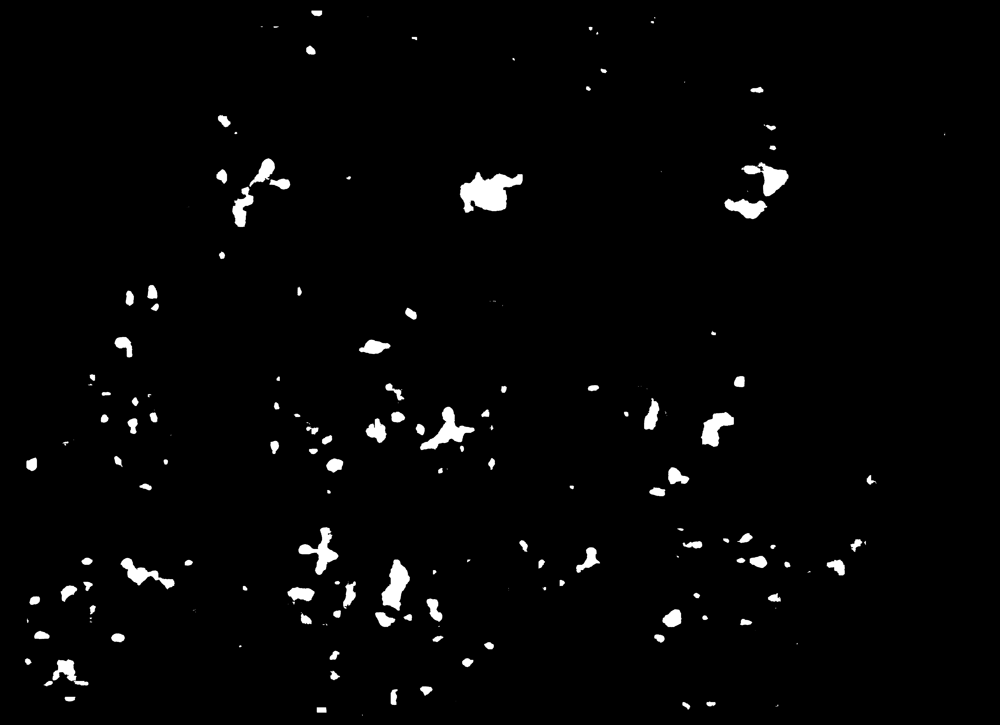

In [ ]:
# import os
# from PIL import Image
# import numpy as np

# def binary_consensus_image(folder_path, threshold=128):
#     # Get all valid image paths
#     valid_extensions = ('.png', '.jpg', '.jpeg', '.bmp', '.tif', '.tiff')
#     image_paths = [os.path.join(folder_path, fname)
#                    for fname in os.listdir(folder_path)
#                    if fname.lower().endswith(valid_extensions)]
    
#     print(f"Found {len(image_paths)} images in {folder_path}")
#     if len(image_paths) < 1:
#         raise ValueError("No valid image files found in the folder.")
    
#     # Load and binarize images
#     images = []
#     first_img = Image.open(image_paths[0]).convert("L")
#     target_size = first_img.size
#     bin_img = np.array(first_img.resize(target_size, Image.NEAREST)) >= threshold
#     images.append(bin_img.astype(np.uint8))  # 1 for white, 0 for black

#     for path in image_paths[1:]:
#         img = Image.open(path).convert("L")
#         img = img.resize(target_size, Image.NEAREST)
#         bin_img = np.array(img) >= threshold
#         images.append(bin_img.astype(np.uint8))
    
#     # Stack into (n_images, height, width)
#     stack = np.stack(images, axis=0)

#     # Only keep pixels where all images agree (all 0 or all 1)
#     consensus = np.all(stack == stack[0], axis=0)

#     # Use values from first image where there is consensus, else set to 0
#     result_array = np.where(consensus, stack[0] * 255, 0).astype(np.uint8)

#     result_image = Image.fromarray(result_array)
#     return result_image

# # Example usage
# folder_path = "pseudo"  # Replace with your actual folder path
# result = binary_consensus_image(folder_path, threshold=130)
# result.save("binary_consensus.png")
# result.show()


Found 3 images in pseudo


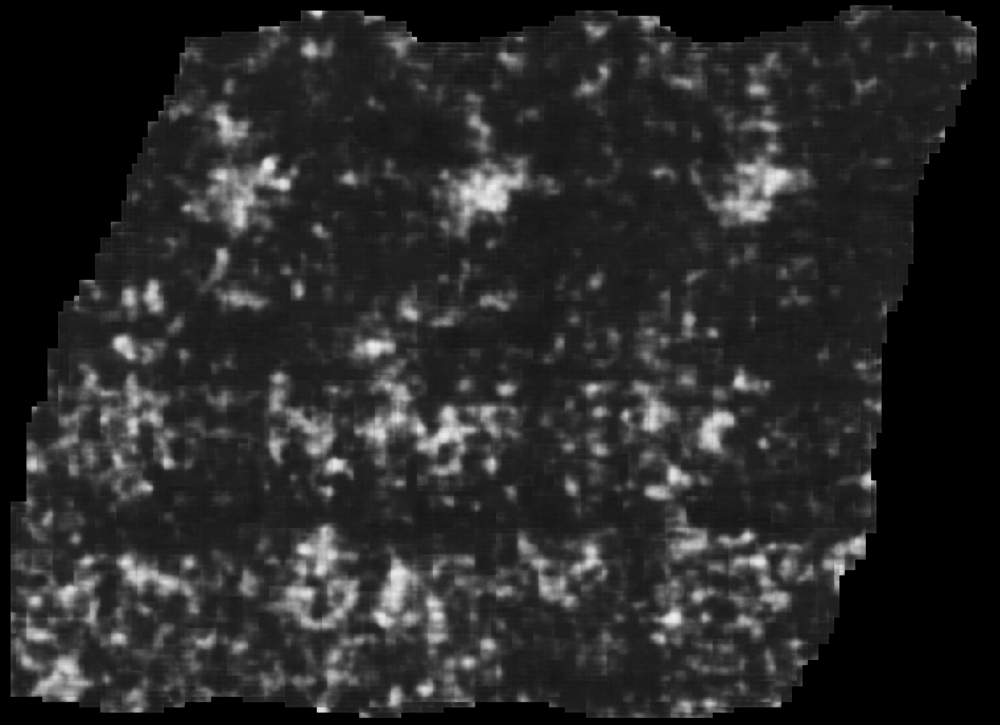

In [ ]:
# import os
# from PIL import Image
# import numpy as np

# def average_image_from_folder(folder_path):
#     # Collect all image file paths in the folder
#     valid_extensions = ('.png', '.jpg', '.jpeg', '.bmp', '.tif', '.tiff')
#     image_paths = [os.path.join(folder_path, fname)
#                    for fname in os.listdir(folder_path)
#                    if fname.lower().endswith(valid_extensions)]
#     print(f"Found {len(image_paths)} images in {folder_path}")
#     if len(image_paths) < 1:
#         raise ValueError("No valid image files found in the folder.")
    
#     # If only one image, return it directly (converted to grayscale and resized)
#     if len(image_paths) == 1:
#         img = Image.open(image_paths[0]).convert("L")
#         return img

#     # Load the first image to determine the target size
#     first_img = Image.open(image_paths[0]).convert("L")
#     target_size = first_img.size  # (width, height)
#     sum_image = np.array(first_img.resize(target_size, Image.NEAREST), dtype=np.float32)

#     # Process the rest of the images
#     for path in image_paths[1:]:
#         img = Image.open(path).convert("L")
#         img = img.resize(target_size, Image.NEAREST)
#         arr = np.array(img, dtype=np.float32)
#         sum_image += arr

#     # Compute average
#     avg_image = sum_image / len(image_paths)

#     # Convert to uint8 image
#     avg_image_uint8 = np.clip(avg_image, 0, 255).astype(np.uint8)
#     result_image = Image.fromarray(avg_image_uint8)

#     return result_image

# # Example usage
# folder_path = "pseudo"  # Replace with your actual folder path
# result = average_image_from_folder(folder_path)
# result.save("average.png")
# result.show()

Found 3 images in pseudo


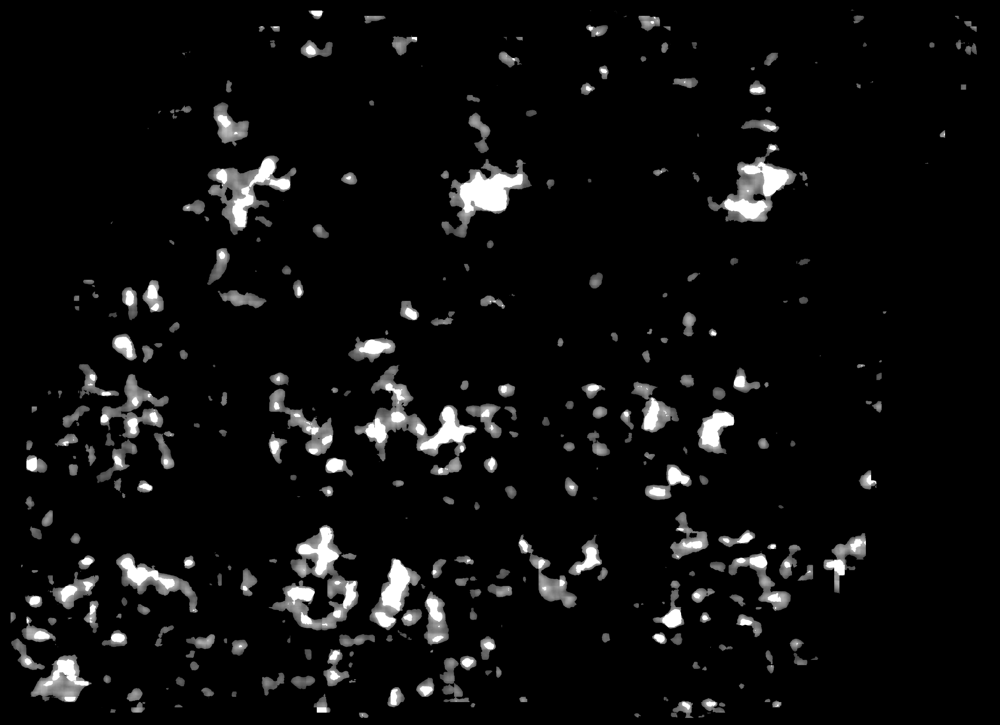

In [ ]:
import os
from PIL import Image
import numpy as np
def label_from_prob_image(prob_image, threshold_0=0.33, threshold_1=0.66):
    """
    Convert a grayscale probability image to discrete labels: 0, 0.5, 1.
    Pixel values in the input should be in 0–255 range.
    """
    prob_array = np.array(prob_image, dtype=np.float32) / 255.0  # Normalize to 0–1

    label_array = np.zeros_like(prob_array)

    label_array[(prob_array > threshold_0) & (prob_array <= threshold_1)] = 0.5
    label_array[prob_array > threshold_1] = 1.0

    # Map labels to pixel values
    output_array = (label_array * 255).astype(np.uint8)
    result_image = Image.fromarray(output_array)

    return result_image

# Example usage
labeled_result = binary_consensus_with_average_fill("pseudo", threshold=128)
# labeled_result = label_from_prob_image(avg_result, threshold_0=0.01, threshold_1=0.75)
# labeled_result = binary_consensus_with_average_fill(folder_path, threshold=128)
# labeled_result.save("binary_consensus.png")
# labeled_result.save("labeled.png")
labeled_result.show()

Found 3 images in pseudo


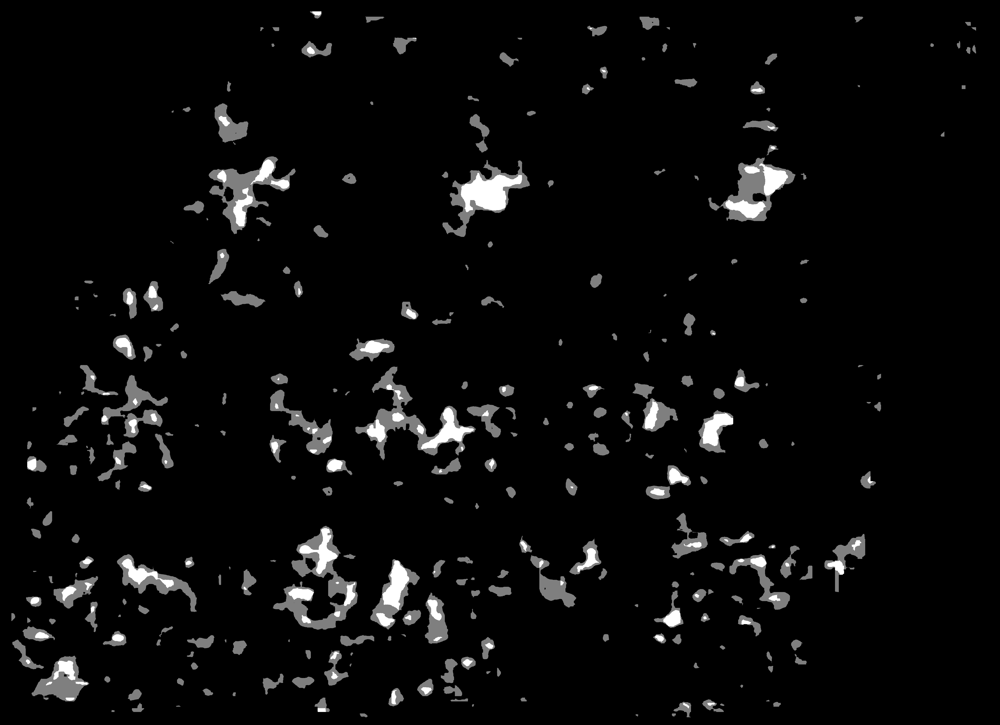

In [40]:
import numpy as np
import cv2
from PIL import Image

def label_from_prob_image(prob_image, threshold_0=0.33, threshold_1=0.66, 
                          erode_kernel_size=0, min_component_size=0):
    """
    Convert a grayscale probability image to discrete labels: 0, 0.5, 1.
    Optionally apply erosion and remove small components.
    """
    # Normalize to [0,1]
    prob_array = np.array(prob_image, dtype=np.float32) / 255.0

    # Optional erosion
    if erode_kernel_size > 0:
        kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (erode_kernel_size, erode_kernel_size))
        prob_array = cv2.erode(prob_array, kernel)

    # Label assignment
    label_array = np.zeros_like(prob_array, dtype=np.float32)
    label_array[(prob_array > threshold_0) & (prob_array <= threshold_1)] = 0.5
    label_array[prob_array > threshold_1] = 1.0

    # Optional: remove small components for label 0.5 and 1.0
    if min_component_size > 0:
        for target_label in [0.5, 1.0]:
            mask = (label_array == target_label).astype(np.uint8)
            num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(mask, connectivity=8)
            cleaned_mask = np.zeros_like(mask)
            for i in range(1, num_labels):  # skip background
                if stats[i, cv2.CC_STAT_AREA] >= min_component_size:
                    cleaned_mask[labels == i] = 1
            label_array[mask == 1] = 0  # reset old label to 0
            label_array[cleaned_mask == 1] = target_label  # restore only kept regions

    # Convert to 0–255 grayscale
    output_array = (label_array * 255).astype(np.uint8)
    result_image = Image.fromarray(output_array)

    return result_image
# avg_result = average_image_from_folder("pseudo")
avg_result = binary_consensus_with_average_fill("pseudo", threshold=128)


labeled_result = label_from_prob_image(
    avg_result,
    threshold_0=0.0000001,
    threshold_1=0.9,
    erode_kernel_size=10,         # Erode with 3x3 kernel
    min_component_size=100       # Remove blobs smaller than 100 pixels
)
# labeled_result.save("labeled.png")
labeled_result.show()

In [37]:
from PIL import Image, ImageDraw
import numpy as np

def find_nonoverlapping_text_regions(image_path, window_height=100, top_k=3, stride=20):
    img = Image.open(image_path).convert("L")
    print(f"Image height: {img.height}, width: {img.width}")
    arr = np.array(img)
    binary = (arr > 127).astype(np.uint8)

    h, w = binary.shape
    scored_windows = []

    # Slide vertically and score each window
    for y in range(0, h - window_height + 1, stride):
        window = binary[y:y + window_height, :]
        ink_count = np.sum(window)
        scored_windows.append((ink_count, y))

    # Sort windows by ink count
    scored_windows.sort(reverse=True)

    selected = []

    for ink_count, y in scored_windows:
        # Check overlap with already selected regions
        overlaps = any(abs(y - other_y) < window_height for _, other_y in selected)
        if not overlaps:
            selected.append((ink_count, y))
        if len(selected) == top_k:
            break

    # Draw the result on a colored version of the binary image
    img_rgb = Image.fromarray(np.stack([binary * 255] * 3, axis=-1))
    draw = ImageDraw.Draw(img_rgb)

    # Store the coordinates of selected rectangles
    rectangles = []
    for i, (score, y) in enumerate(selected):
        draw.rectangle([0, y, w, y + window_height], outline="blue", width=10)
        draw.text((5, y + 5), f"#{i + 1} | Dots: {score}", fill="blue")
        rectangles.append((0, y, w, y + window_height))  # Storing rectangle coordinates

    print(f"Found {len(selected)} non-overlapping top regions.")
    return img_rgb, rectangles

def create_black_and_white_image(original_image_path, rectangles, output_path):
    from PIL import Image
    import numpy as np

    # Open the original image
    original_img = Image.open(original_image_path)
    original_arr = np.array(original_img)

    # Convert grayscale to 3-channel RGB-like format
    if len(original_arr.shape) == 2:
        original_arr = np.stack([original_arr] * 3, axis=-1)

    h, w, _ = original_arr.shape
    output_arr = np.full_like(original_arr, 127, dtype=np.uint8)  # Default gray background

    # Sort rectangles by vertical position (top to bottom)
    rectangles = sorted(rectangles, key=lambda r: r[1])

    # Fill the regions inside the rectangles with original content
    for rect in rectangles:
        x0, y0, x1, y1 = rect
        output_arr[y0:y1, x0:x1] = original_arr[y0:y1, x0:x1]

    # Fill areas between rectangles with black
    for i in range(1, len(rectangles)):
        prev_bottom = rectangles[i - 1][3]
        curr_top = rectangles[i][1]
        output_arr[prev_bottom:curr_top, :, :] = 127  # Black

    # (Optional) Fill above the first rectangle and below the last one with gray (already gray by default)

    # Convert to image and save
    output_img = Image.fromarray(output_arr)
    output_img.save(output_path)
    output_img.show()

Found 3 images in pseudo
Image height: 4395, width: 6061
Found 1 non-overlapping top regions.


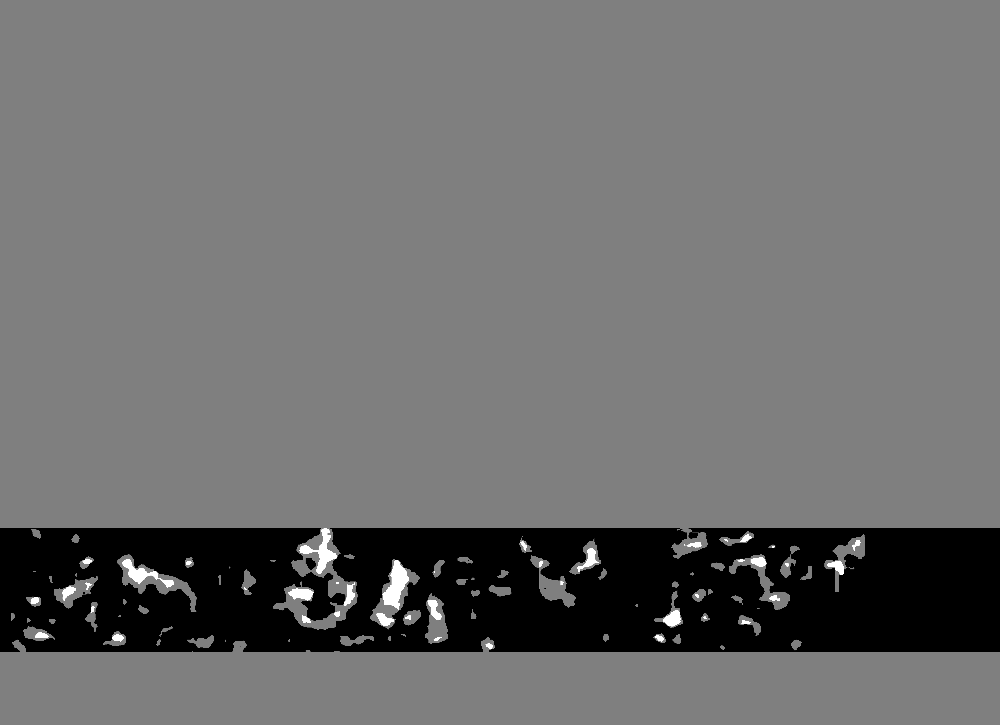

In [38]:
avg_result = binary_consensus_with_average_fill("pseudo", threshold=128)


labeled_result = label_from_prob_image(
    avg_result,
    threshold_0=0.15,
    threshold_1=0.9,
    erode_kernel_size=10,         # Erode with 3x3 kernel
    min_component_size=100       # Remove blobs smaller than 100 pixels
)
labeled_result_path = "result_bin_2.png"
labeled_result.save(labeled_result_path)

# Step 2: Find dense text regions
result_img, rectangles = find_nonoverlapping_text_regions(
    labeled_result_path, 
    window_height=150 * 5, 
    top_k=1, 
    stride=20
)
# result_img.save("nonoverlapping_text_lines_new.png")
# result_img.show()

# Step 3: Create focused black-and-white image
create_black_and_white_image(labeled_result_path, rectangles, "black_and_white_image.png")